# Unstructured Data Analysis - Assignment 2

This assignment will aim to analyse the characteristics of social networks across three online platforms (Instagram, Facebook and Twitter). First we will gather initial statistics on the network data to understand their characteristics such as connectedness or centrality. Next we will aim to identify communities within each network using methods such as Girvan-Newman and Kernighan-lin, and compare these results. Finally we will plot our results from the community detection and conclude our results from this analyses.


### Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import networkx.algorithms.community as nx_comm
import node2vec
import gensim
import warnings
warnings.filterwarnings('ignore')
import node2vec.node2vec as n2vmod
from sklearn.metrics import adjusted_rand_score


### Import Datasets

In [2]:
Facebook_df = pd.read_excel('Facebook_Data.xlsx', index_col=0)
Twitter_df = pd.read_excel('Twitter_Data.xlsx', index_col=0)
Instagram_df = pd.read_excel('Instagram_Data.xlsx', index_col=0)

In [3]:
Facebook_df.head()

,Meredith Stransky,Brittney Mazzella,Yi Cook,Porter Devries,Suzanne Syverson,Ladawn Creason,Mikel Lamberson,Lakendra Lasiter,Kate Shiver,Sharika Aiken,...,Tehmina,Happy Bacha,Younus,AVA,Alfred,Danish,Matloob,Sameed Shahzad,Frazer,Mubashir
Meredith Stransky,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Brittney Mazzella,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,1,0,0,0,1,0
Yi Cook,0,0,0,0,0,0,0,1,0,0,...,1,0,1,0,0,0,0,0,0,0
Porter Devries,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Suzanne Syverson,0,0,0,0,0,0,0,0,1,0,...,1,0,0,1,0,0,0,0,0,0


In [4]:
Twitter_df.head()

,Meredith Stransky,Brittney Mazzella,Yi Cook,Porter Devries,Suzanne Syverson,Ladawn Creason,Mikel Lamberson,Lakendra Lasiter,Kate Shiver,Sharika Aiken,...,Tehmina,Happy Bacha,Younus,AVA,Alfred,Danish,Matloob,Sameed Shahzad,Frazer,Mubashir
Meredith Stransky,0,0,1,1,0,0,1,0,1,1,...,0,0,0,1,0,0,0,1,1,0
Brittney Mazzella,0,0,1,0,0,0,1,1,0,0,...,1,1,1,1,1,0,0,0,1,1
Yi Cook,1,1,0,0,1,1,0,0,1,0,...,1,1,0,1,0,0,0,1,1,1
Porter Devries,1,0,0,0,0,1,0,1,1,0,...,0,0,1,1,0,1,0,0,0,0
Suzanne Syverson,0,0,1,0,0,1,0,1,1,1,...,1,0,0,0,0,1,0,1,0,0


In [5]:
Instagram_df.head()

,Meredith Stransky,Brittney Mazzella,Yi Cook,Porter Devries,Suzanne Syverson,Ladawn Creason,Mikel Lamberson,Lakendra Lasiter,Kate Shiver,Sharika Aiken,...,Tehmina,Happy Bacha,Younus,AVA,Alfred,Danish,Matloob,Sameed Shahzad,Frazer,Mubashir
Meredith Stransky,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Brittney Mazzella,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Yi Cook,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Porter Devries,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
Suzanne Syverson,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
Facebook_df.shape

(1000, 1000)

In [7]:
Twitter_df.shape

(1000, 1000)

In [8]:
Instagram_df.shape

(1000, 1000)

In [9]:
combined = Facebook_df + Twitter_df + Instagram_df

In [10]:
combined

,Meredith Stransky,Brittney Mazzella,Yi Cook,Porter Devries,Suzanne Syverson,Ladawn Creason,Mikel Lamberson,Lakendra Lasiter,Kate Shiver,Sharika Aiken,...,Tehmina,Happy Bacha,Younus,AVA,Alfred,Danish,Matloob,Sameed Shahzad,Frazer,Mubashir
Meredith Stransky,0,0,1,1,0,0,1,0,1,1,...,0,0,1,1,0,0,0,1,1,0
Brittney Mazzella,0,0,1,0,0,0,1,1,0,1,...,1,1,1,2,2,0,0,0,2,1
Yi Cook,1,1,0,0,1,1,0,1,1,0,...,2,1,1,1,0,0,0,1,1,1
Porter Devries,1,0,0,0,0,1,1,1,1,0,...,0,0,1,1,0,1,1,0,0,0
Suzanne Syverson,0,0,1,0,0,1,0,1,2,1,...,2,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Danish,0,0,0,1,1,0,0,0,1,0,...,1,1,1,1,0,0,0,1,1,1
Matloob,0,0,0,1,0,0,1,0,1,0,...,0,1,1,0,1,0,0,0,0,0
Sameed Shahzad,1,0,1,0,1,1,1,1,0,1,...,0,0,0,1,1,1,0,0,0,1
Frazer,1,2,1,0,0,0,0,1,0,0,...,1,0,1,1,1,1,0,0,0,1


In [11]:
combined_bin = (combined > 0).astype(int)
combined_bin

,Meredith Stransky,Brittney Mazzella,Yi Cook,Porter Devries,Suzanne Syverson,Ladawn Creason,Mikel Lamberson,Lakendra Lasiter,Kate Shiver,Sharika Aiken,...,Tehmina,Happy Bacha,Younus,AVA,Alfred,Danish,Matloob,Sameed Shahzad,Frazer,Mubashir
Meredith Stransky,0,0,1,1,0,0,1,0,1,1,...,0,0,1,1,0,0,0,1,1,0
Brittney Mazzella,0,0,1,0,0,0,1,1,0,1,...,1,1,1,1,1,0,0,0,1,1
Yi Cook,1,1,0,0,1,1,0,1,1,0,...,1,1,1,1,0,0,0,1,1,1
Porter Devries,1,0,0,0,0,1,1,1,1,0,...,0,0,1,1,0,1,1,0,0,0
Suzanne Syverson,0,0,1,0,0,1,0,1,1,1,...,1,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Danish,0,0,0,1,1,0,0,0,1,0,...,1,1,1,1,0,0,0,1,1,1
Matloob,0,0,0,1,0,0,1,0,1,0,...,0,1,1,0,1,0,0,0,0,0
Sameed Shahzad,1,0,1,0,1,1,1,1,0,1,...,0,0,0,1,1,1,0,0,0,1
Frazer,1,1,1,0,0,0,0,1,0,0,...,1,0,1,1,1,1,0,0,0,1


In [12]:
degree = combined_bin.sum(axis=1)
top100_nodes = degree.sort_values(ascending=False).head(100).index
Facebook_df_top = Facebook_df.loc[top100_nodes, top100_nodes]
Twitter_df_top = Twitter_df.loc[top100_nodes, top100_nodes]
Instagram_df_top = Instagram_df.loc[top100_nodes, top100_nodes]

### Network Metrics

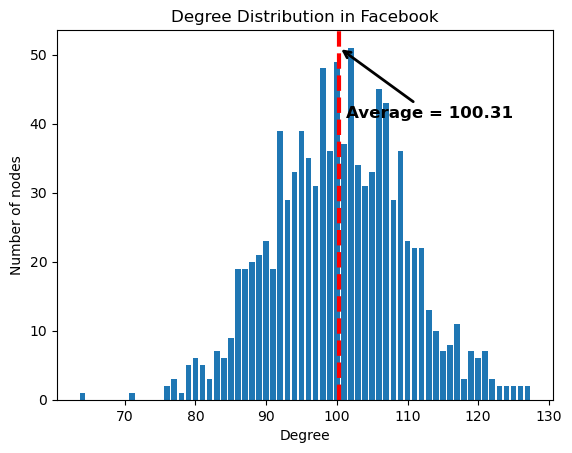

In [13]:
degrees = np.sum(Facebook_df, axis=1)

unique_degrees, counts = np.unique(degrees, return_counts=True)
avg_degree = np.mean(degrees)

plt.bar(unique_degrees, counts)

plt.axvline(
    avg_degree,
    linestyle='--',
    linewidth=3,
    color='red'
)

plt.annotate(
    f"Average = {avg_degree:.2f}",
    xy=(avg_degree, max(counts)),
    xytext=(avg_degree + 1, max(counts) * 0.8),
    arrowprops=dict(arrowstyle="->", linewidth=2),
    fontsize=12,
    fontweight='bold'
)

plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.title("Degree Distribution in Facebook")
plt.show()


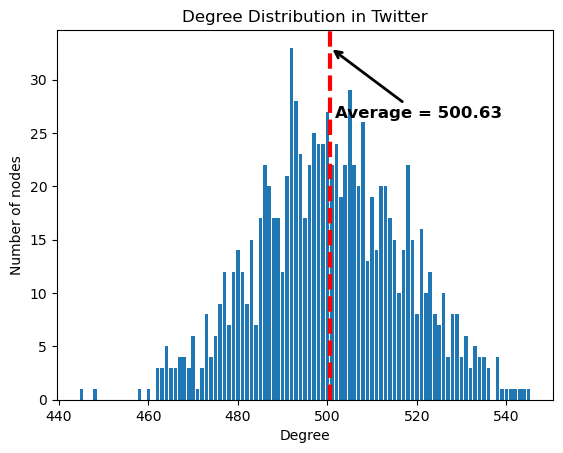

In [14]:
degrees = np.sum(Twitter_df, axis=1)

unique_degrees, counts = np.unique(degrees, return_counts=True)
avg_degree = np.mean(degrees)

plt.bar(unique_degrees, counts)

plt.axvline(
    avg_degree,
    linestyle='--',
    linewidth=3,
    color='red'
)

plt.annotate(
    f"Average = {avg_degree:.2f}",
    xy=(avg_degree, max(counts)),
    xytext=(avg_degree + 1, max(counts) * 0.8),
    arrowprops=dict(arrowstyle="->", linewidth=2),
    fontsize=12,
    fontweight='bold'
)

plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.title("Degree Distribution in Twitter")
plt.show()


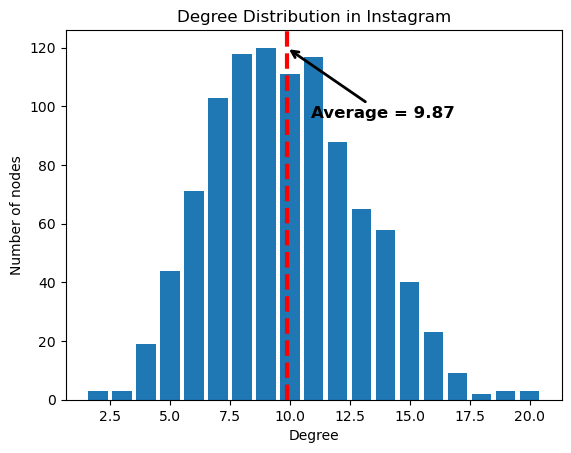

In [15]:
degrees = np.sum(Instagram_df, axis=1)

unique_degrees, counts = np.unique(degrees, return_counts=True)
avg_degree = np.mean(degrees)

plt.bar(unique_degrees, counts)

plt.axvline(
    avg_degree,
    linestyle='--',
    linewidth=3,
    color='red'
)

plt.annotate(
    f"Average = {avg_degree:.2f}",
    xy=(avg_degree, max(counts)),
    xytext=(avg_degree + 1, max(counts) * 0.8),
    arrowprops=dict(arrowstyle="->", linewidth=2),
    fontsize=12,
    fontweight='bold'
)

plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.title("Degree Distribution in Instagram")
plt.show()


In [16]:
is_symmetric = np.array_equal(Facebook_df, Facebook_df.T)
print(is_symmetric)

True


In [17]:
is_symmetric = np.array_equal(Twitter_df, Twitter_df.T)
print(is_symmetric)

True


In [18]:
is_symmetric = np.array_equal(Instagram_df, Instagram_df.T)
print(is_symmetric)

True


In [19]:
N = Facebook_df.shape[0]
Facebook_df_Array = Facebook_df.to_numpy().sum()
E = np.sum(Facebook_df_Array) / 2
density = (2 * E) / (N * (N - 1))
print("Graph density:", density)

Graph density: 0.10040640640640641


In [20]:
N = Twitter_df.shape[0]
Twitter_df_Array = Twitter_df.to_numpy().sum()
E = np.sum(Twitter_df_Array) / 2
density = (2 * E) / (N * (N - 1))
print("Graph density:", density)

Graph density: 0.5011311311311312


In [21]:
N = Instagram_df.shape[0]
Instagram_df_Array = Instagram_df.to_numpy().sum()
E = np.sum(Instagram_df_Array) / 2
density = (2 * E) / (N * (N - 1)) 
print("Graph density:", density)

Graph density: 0.009875875875875876


In [22]:
networks = {
    "Facebook": Facebook_df,
    "Twitter": Twitter_df,
    "Instagram": Instagram_df
}

rows = []

for name, df in networks.items():
    N = df.shape[0]
    E = df.to_numpy().sum() / 2
    density = (2 * E) / (N * (N - 1))
    rows.append({"Network Type": name, "Graph Density": density})

density_table = pd.DataFrame(rows)
density_table


,Network Type,Graph Density
0,Facebook,0.100406
1,Twitter,0.501131
2,Instagram,0.009876


In [23]:
A = Facebook_df.to_numpy()
G = nx.from_numpy_array(A)

local_clustering = nx.clustering(G)

global_clustering = nx.transitivity(G)
print(global_clustering)

0.10028972827003145


In [24]:
A = Twitter_df.to_numpy()
G = nx.from_numpy_array(A)

local_clustering = nx.clustering(G)

global_clustering = nx.transitivity(G)
print(global_clustering)

0.5012008407430726


In [25]:
A = Instagram_df.to_numpy()
G = nx.from_numpy_array(A)

local_clustering = nx.clustering(G)

global_clustering = nx.transitivity(G)
print(global_clustering)

0.00839903658109805


In [26]:
networks = {
    "Facebook": Facebook_df,
    "Twitter": Twitter_df,
    "Instagram": Instagram_df
}

rows = []

for name, df in networks.items():
    A = df.to_numpy()
    G = nx.from_numpy_array(A)
    global_clustering = nx.transitivity(G)
    rows.append({
        "Network Type": name,
        "Global Clustering Coefficient": global_clustering
    })

clustering_table = pd.DataFrame(rows)
clustering_table


,Network Type,Global Clustering Coefficient
0,Facebook,0.100290
1,Twitter,0.501201
2,Instagram,0.008399


In [27]:
A = Facebook_df.to_numpy()

np.fill_diagonal(A, 0)
G = nx.from_numpy_array(A)  # undirected

largest_cc_nodes = max(nx.connected_components(G), key=len)
Gcc = G.subgraph(largest_cc_nodes).copy()

aspl = nx.average_shortest_path_length(Gcc)
print("Average shortest path length (largest CC):", aspl)
print("Size of largest CC:", Gcc.number_of_nodes(), "of", G.number_of_nodes())


Average shortest path length (largest CC): 1.8996316316316317
Size of largest CC: 1000 of 1000


In [28]:
A = Twitter_df.to_numpy()

np.fill_diagonal(A, 0)
G = nx.from_numpy_array(A)  # undirected

largest_cc_nodes = max(nx.connected_components(G), key=len)
Gcc = G.subgraph(largest_cc_nodes).copy()

aspl = nx.average_shortest_path_length(Gcc)
print("Average shortest path length (largest CC):", aspl)
print("Size of largest CC:", Gcc.number_of_nodes(), "of", G.number_of_nodes())


Average shortest path length (largest CC): 1.498868868868869
Size of largest CC: 1000 of 1000


In [29]:
A = Instagram_df.to_numpy()

np.fill_diagonal(A, 0)
G = nx.from_numpy_array(A)  # undirected

largest_cc_nodes = max(nx.connected_components(G), key=len)
Gcc = G.subgraph(largest_cc_nodes).copy()

aspl = nx.average_shortest_path_length(Gcc)
print("Average shortest path length (largest CC):", aspl)
print("Size of largest CC:", Gcc.number_of_nodes(), "of", G.number_of_nodes())


Average shortest path length (largest CC): 3.273137137137137
Size of largest CC: 1000 of 1000


In [30]:

networks = {
    "Facebook": Facebook_df,
    "Twitter": Twitter_df,
    "Instagram": Instagram_df
}

rows = []

for name, df in networks.items():
    A = df.to_numpy()
    np.fill_diagonal(A, 0)

    G = nx.from_numpy_array(A)

    # largest connected component
    largest_cc_nodes = max(nx.connected_components(G), key=len)
    Gcc = G.subgraph(largest_cc_nodes).copy()

    aspl = nx.average_shortest_path_length(Gcc)

    rows.append({
        "Network Type": name,
        "Average Shortest Path Length": aspl
       # "Largest CC Size": Gcc.number_of_nodes()
    })

aspl_table = pd.DataFrame(rows)
aspl_table


,Network Type,Average Shortest Path Length
0,Facebook,1.899632
1,Twitter,1.498869
2,Instagram,3.273137


In [31]:

networks = {
    "Facebook": Facebook_df,
    "Twitter": Twitter_df,
    "Instagram": Instagram_df
}

rows = []

for name, df in networks.items():
    A = df.to_numpy()
    np.fill_diagonal(A, 0)

    G = nx.from_numpy_array(A)

    #  Density 
    N = df.shape[0]
    E = A.sum() / 2
    density = (2 * E) / (N * (N - 1))

    #  Global clustering (transitivity) 
    global_clustering = nx.transitivity(G)

    #  ASPL 
    largest_cc_nodes = max(nx.connected_components(G), key=len)
    Gcc = G.subgraph(largest_cc_nodes).copy()
    aspl = nx.average_shortest_path_length(Gcc)

    rows.append({
        "Network Type": name,
        "Graph Density": density,
        "Global Clustering (Transitivity)": global_clustering,
        "Average Shortest Path Length": aspl
    })

summary_table = pd.DataFrame(rows)
summary_table


,Network Type,Graph Density,Global Clustering (Transitivity),Average Shortest Path Length
0,Facebook,0.100406,0.100290,1.899632
1,Twitter,0.501131,0.501201,1.498869
2,Instagram,0.009876,0.008399,3.273137


### Community Detection

Girvan–Newman (5.2.2)

Kernighan–Lin (5.2.1)


### Networks with top 100 nodes across all platforms

In [32]:

G = nx.from_pandas_adjacency(Facebook_df_top, create_using=nx.Graph)
print(G.number_of_nodes(), "nodes,", G.number_of_edges(), "edges")


100 nodes, 532 edges


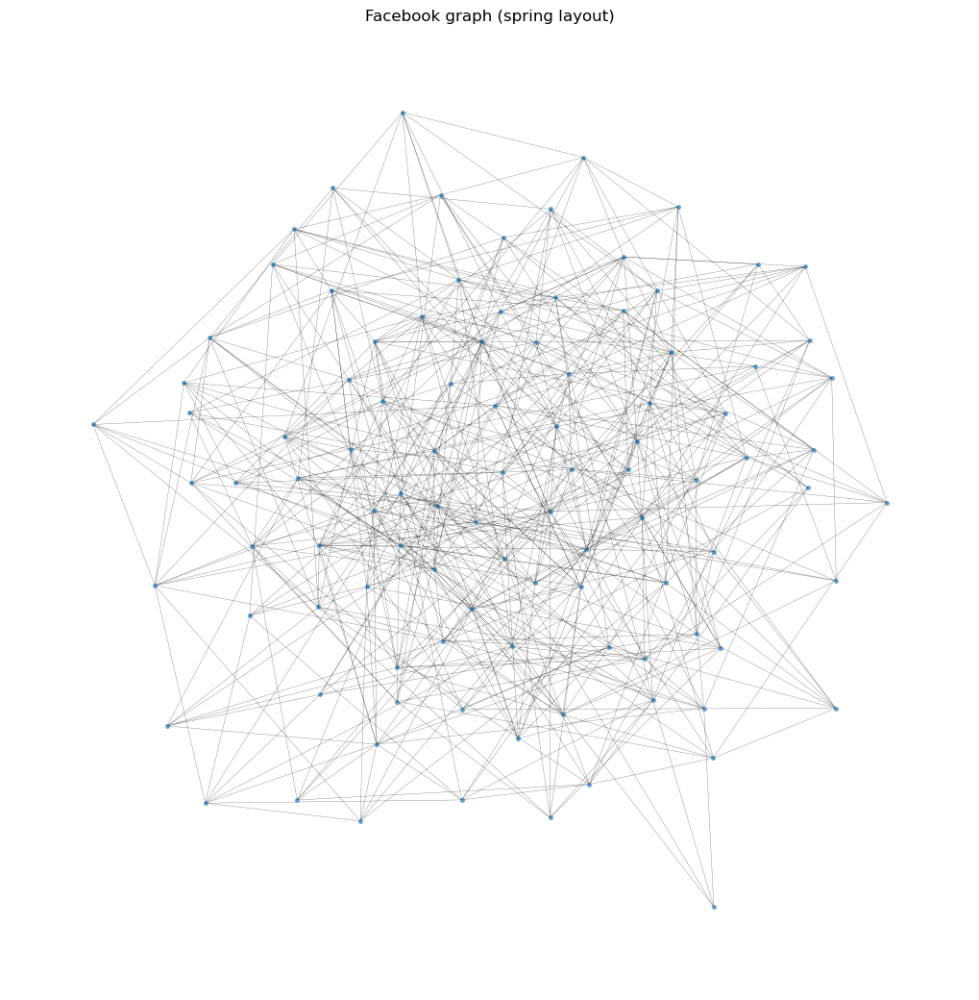

In [33]:

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, k=1/len(G)**0.5, seed=42)
nx.draw(
    G, pos,
    node_size=12, linewidths=0,
    width=0.2, alpha=0.7, with_labels=False
)
plt.title("Facebook graph (spring layout)")
plt.show()


In [34]:

G = nx.from_pandas_adjacency(Twitter_df_top, create_using=nx.Graph)
print(G.number_of_nodes(), "nodes,", G.number_of_edges(), "edges")

100 nodes, 2747 edges


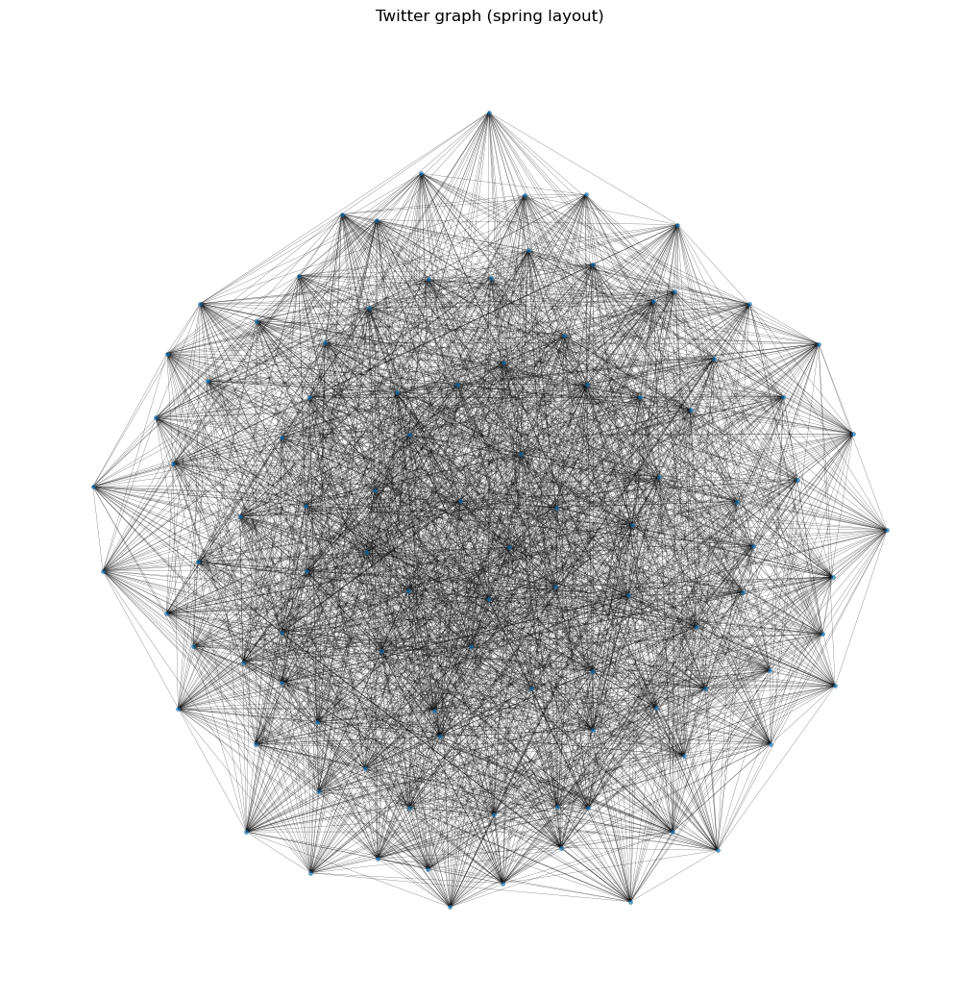

In [35]:

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, k=1/len(G)**0.5, seed=42)
nx.draw(
    G, pos,
    node_size=12, linewidths=0,
    width=0.2, alpha=0.7, with_labels=False
)
plt.title("Twitter graph (spring layout)")
plt.show()


In [36]:

G = nx.from_pandas_adjacency(Instagram_df_top, create_using=nx.Graph)
print(G.number_of_nodes(), "nodes,", G.number_of_edges(), "edges")

100 nodes, 50 edges


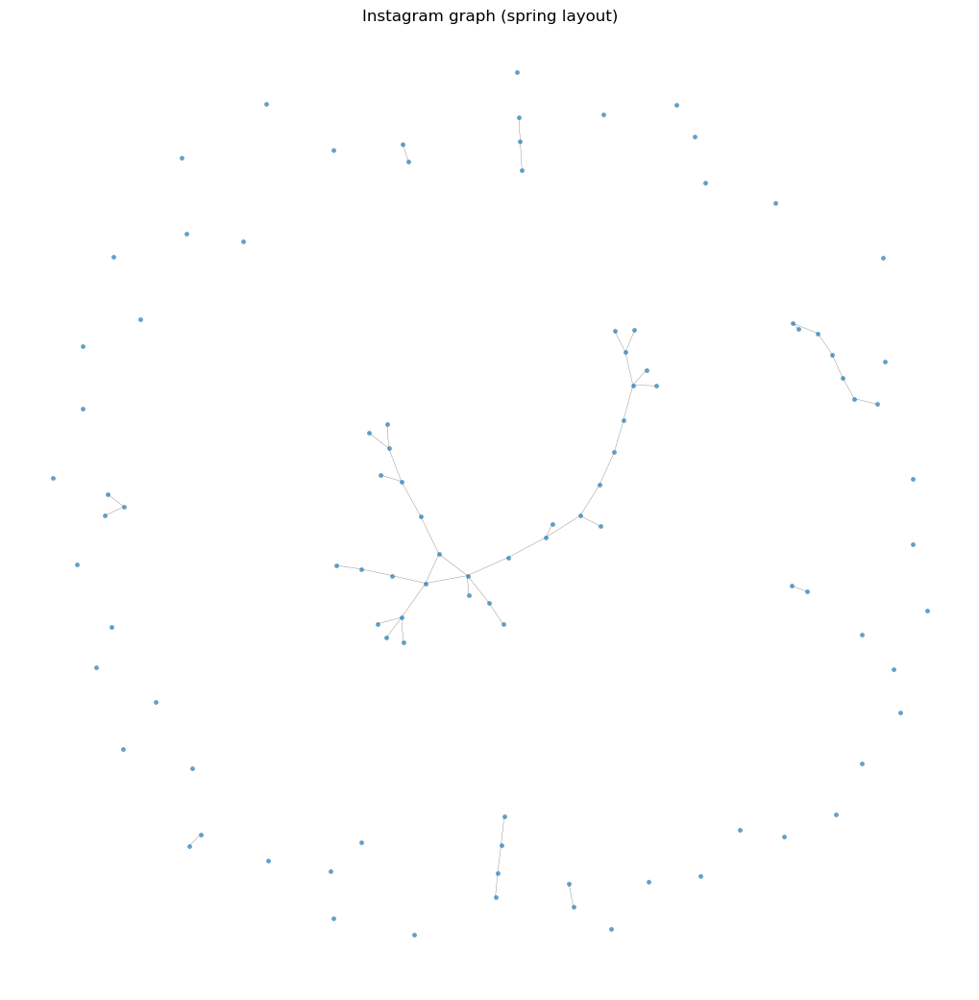

In [37]:

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, k=1/len(G)**0.5, seed=42)
nx.draw(
    G, pos,
    node_size=12, linewidths=0,
    width=0.2, alpha=0.7, with_labels=False
)
plt.title("Instagram graph (spring layout)")
plt.show()


### Graphs again using top 100 in each network seperately

In [38]:
degree = Facebook_df.sum(axis=1)
top100_nodes = degree.sort_values(ascending=False).head(100).index
Facebook_df_top = Facebook_df.loc[top100_nodes, top100_nodes]

degree = Twitter_df.sum(axis=1)
top100_nodes = degree.sort_values(ascending=False).head(100).index
Twitter_df_top = Twitter_df.loc[top100_nodes, top100_nodes]

degree = Instagram_df.sum(axis=1)
top100_nodes = degree.sort_values(ascending=False).head(100).index
Instagram_df_top = Instagram_df.loc[top100_nodes, top100_nodes]

In [39]:

Facebook_G = nx.from_pandas_adjacency(Facebook_df_top, create_using=nx.Graph)
print(Facebook_G.number_of_nodes(), "nodes,", Facebook_G.number_of_edges(), "edges")

100 nodes, 678 edges


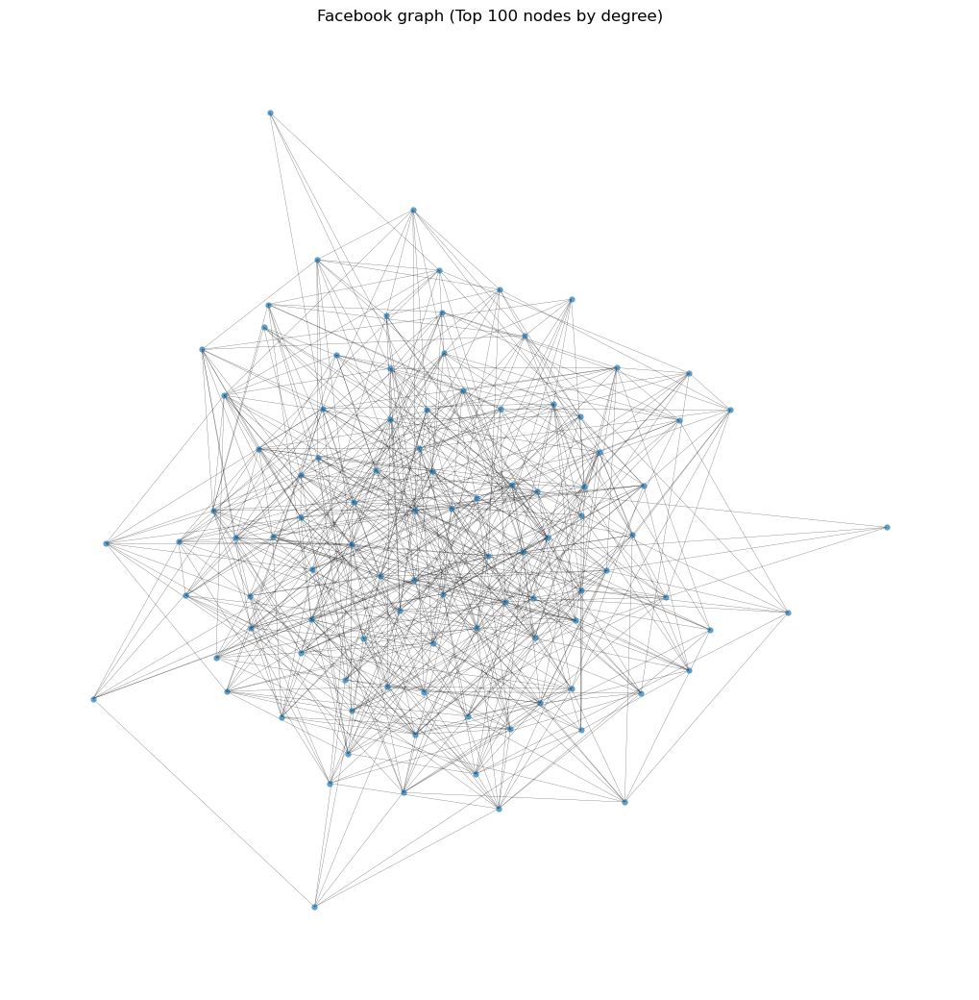

In [40]:

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(Facebook_G, k=1/len(Facebook_G)**0.5, seed=42)
nx.draw(
    Facebook_G, pos,
    node_size=20, linewidths=0,
    width=0.2, alpha=0.7, with_labels=False
)
plt.title("Facebook graph (Top 100 nodes by degree)")
plt.show()


In [41]:

Twitter_G = nx.from_pandas_adjacency(Twitter_df_top, create_using=nx.Graph)
print(Twitter_G.number_of_nodes(), "nodes,", Twitter_G.number_of_edges(), "edges")

100 nodes, 2755 edges


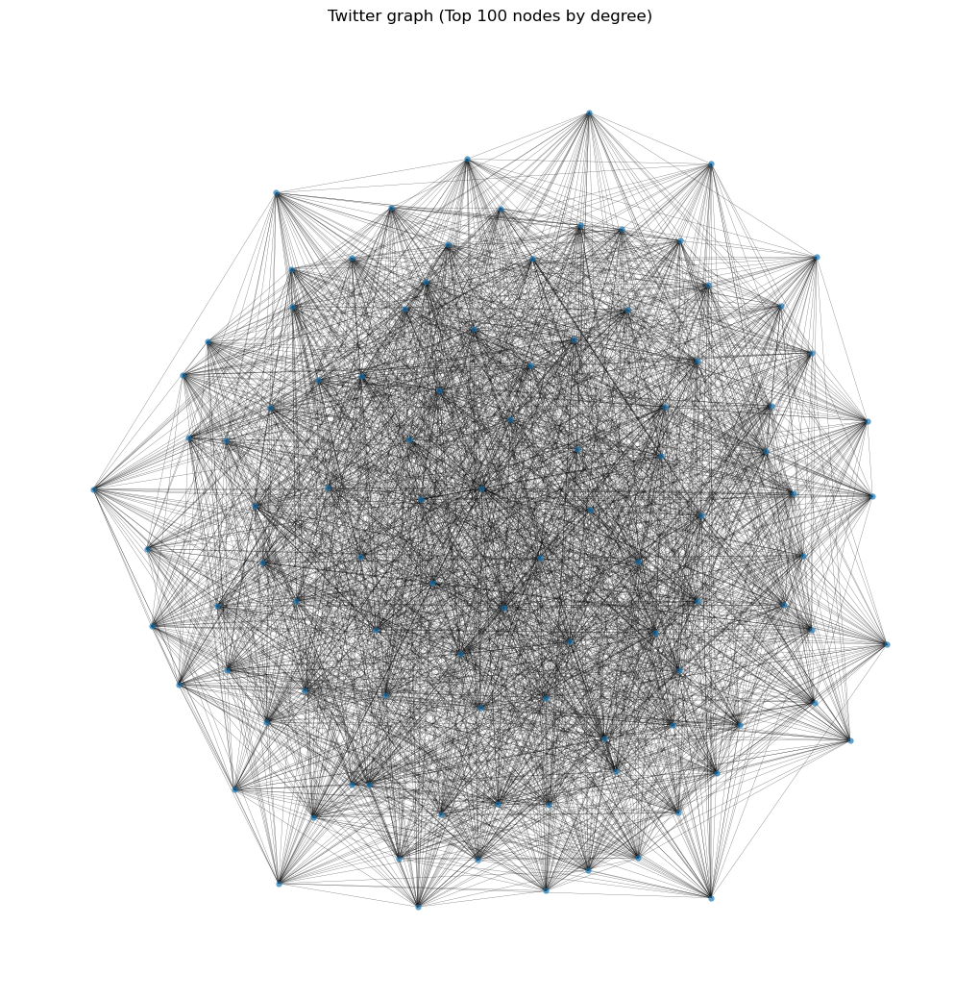

In [42]:

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(Twitter_G, k=1/len(Twitter_G)**0.5, seed=42)
nx.draw(
    Twitter_G, pos,
    node_size=20, linewidths=0,
    width=0.2, alpha=0.7, with_labels=False
)
plt.title("Twitter graph (Top 100 nodes by degree)")
plt.show()


In [43]:

Instagram_G = nx.from_pandas_adjacency(Instagram_df_top, create_using=nx.Graph)
print(Instagram_G.number_of_nodes(), "nodes,", Instagram_G.number_of_edges(), "edges")

100 nodes, 112 edges


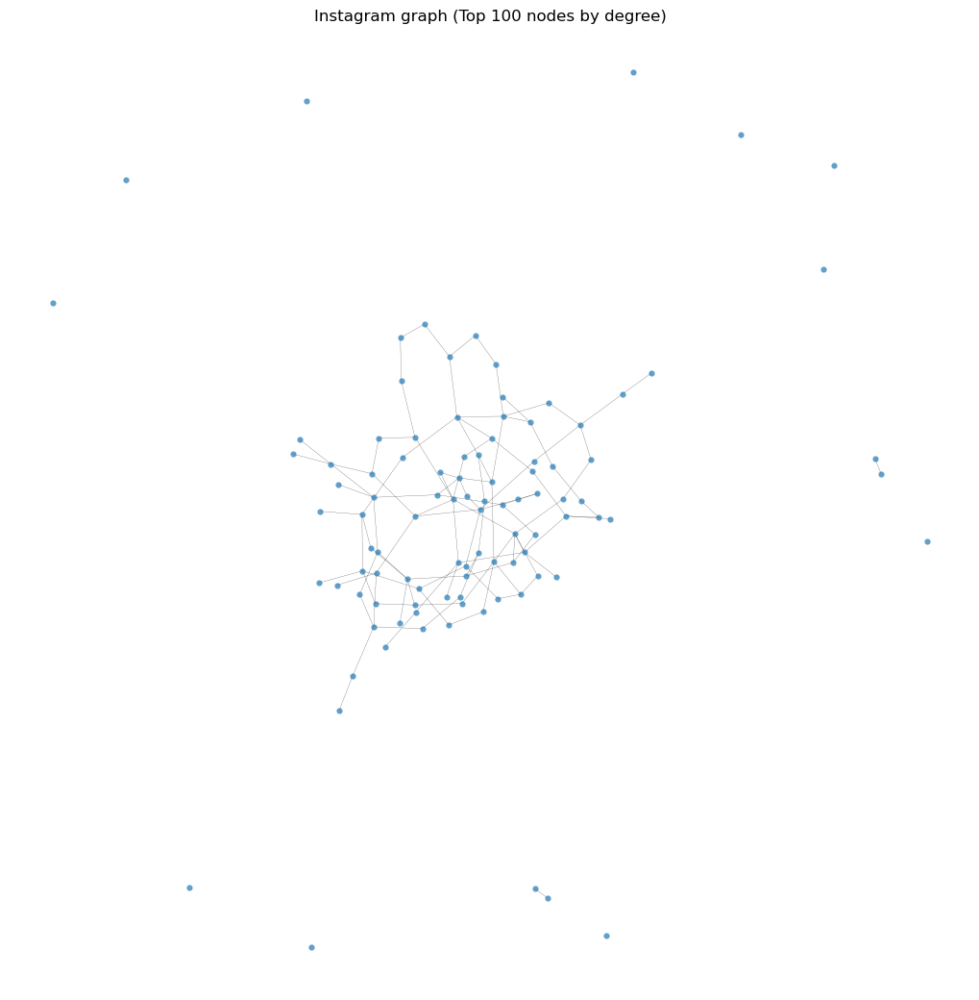

In [44]:

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(Instagram_G, k=1/len(Instagram_G)**0.5, seed=42)
nx.draw(
    Instagram_G, pos,
    node_size=20, linewidths=0,
    width=0.2, alpha=0.7, with_labels=False
)
plt.title("Instagram graph (Top 100 nodes by degree)")
plt.show()


### Largest Connected Component

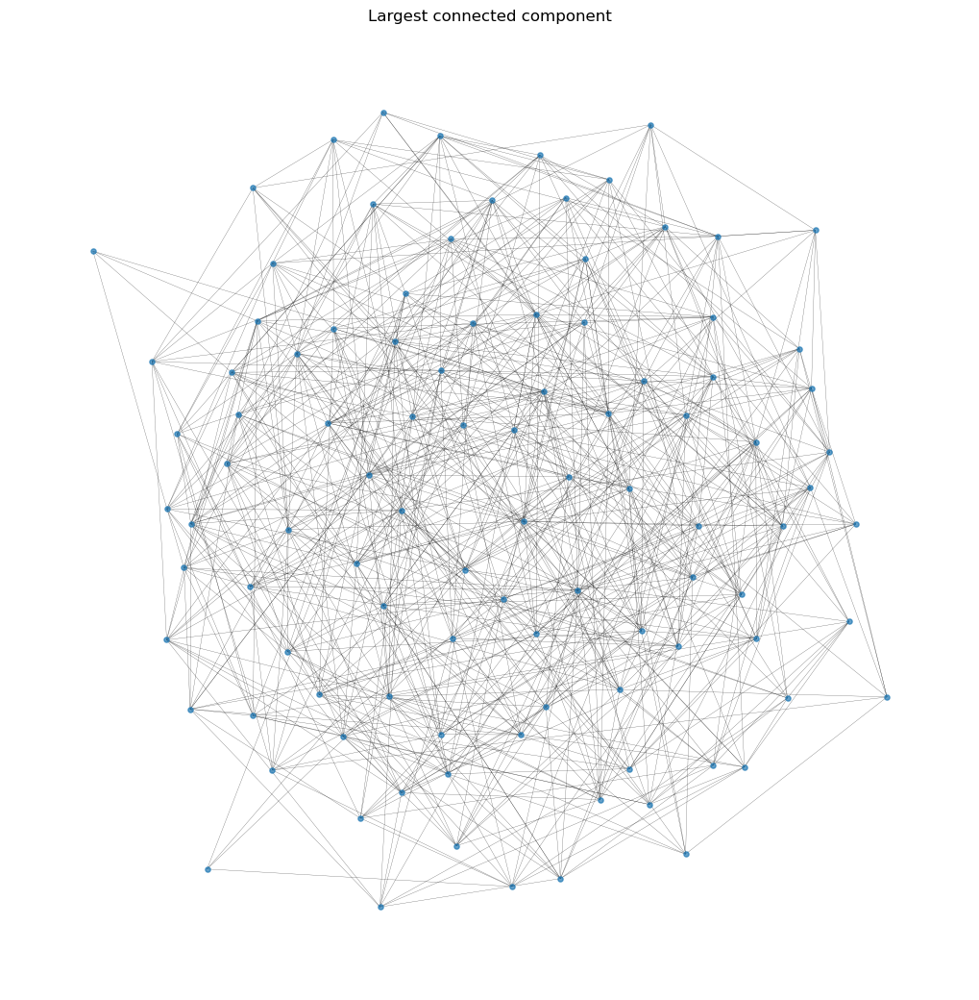

In [45]:
largest_cc_nodes = max(nx.connected_components(Facebook_G), key=len)
Facebook_H = Facebook_G.subgraph(largest_cc_nodes).copy()

plt.figure(figsize=(10, 10))
pos = nx.kamada_kawai_layout(Facebook_H)
nx.draw(Facebook_H, pos, node_size=14, width=0.2, alpha=0.7, with_labels=False)
plt.title("Largest connected component")
plt.show()

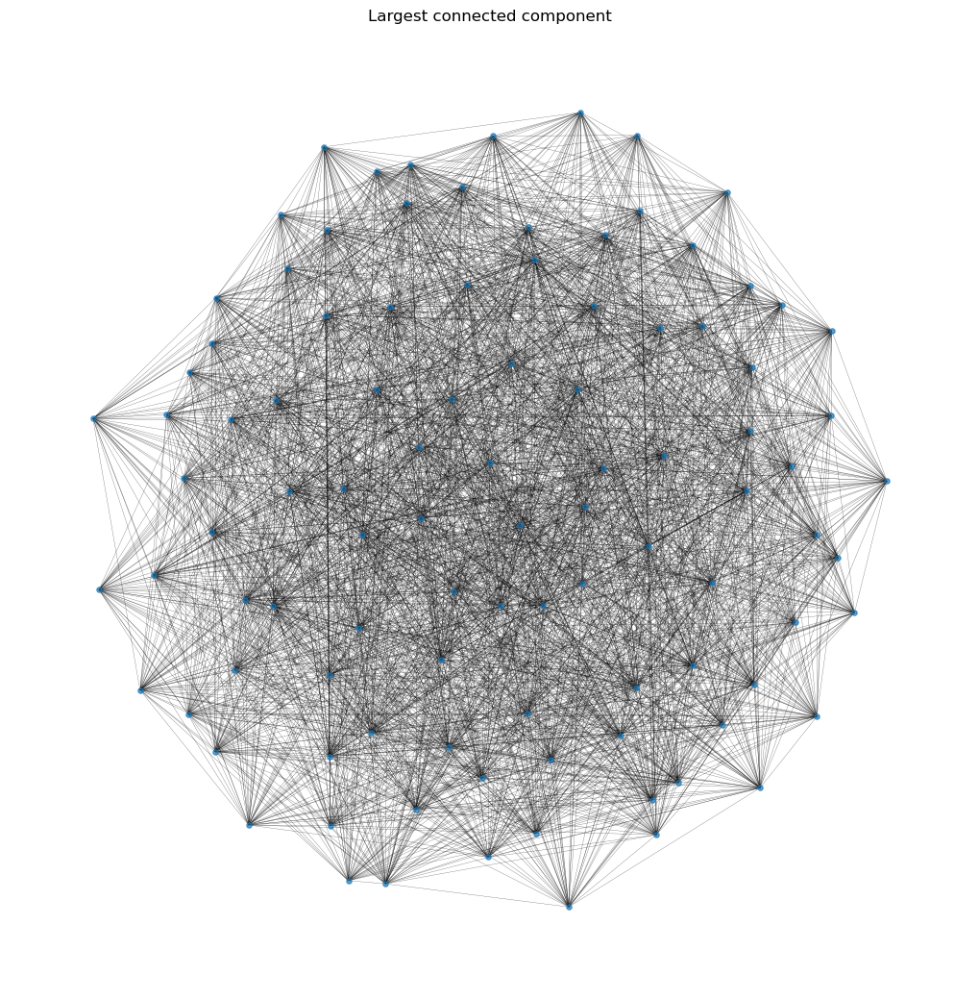

In [46]:
largest_cc_nodes = max(nx.connected_components(Twitter_G), key=len)
Twitter_H = Twitter_G.subgraph(largest_cc_nodes).copy()

plt.figure(figsize=(10, 10))
pos = nx.kamada_kawai_layout(Twitter_H)
nx.draw(Twitter_H, pos, node_size=14, width=0.2, alpha=0.7, with_labels=False)
plt.title("Largest connected component")
plt.show()

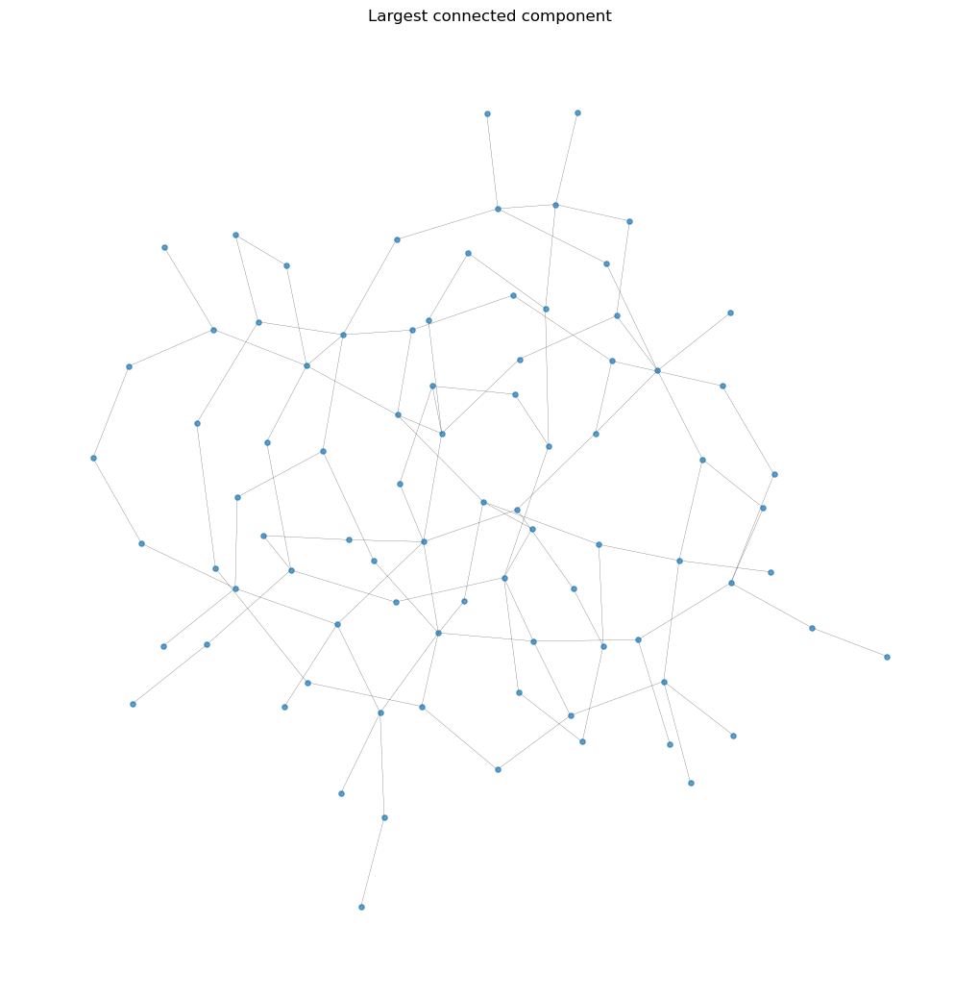

In [47]:
largest_cc_nodes = max(nx.connected_components(Instagram_G), key=len)
Instagram_H = Instagram_G.subgraph(largest_cc_nodes).copy()

plt.figure(figsize=(10, 10))
pos = nx.kamada_kawai_layout(Instagram_H)
nx.draw(Instagram_H, pos, node_size=14, width=0.2, alpha=0.7, with_labels=False)
plt.title("Largest connected component")
plt.show()

## Start implementing Community Detection

## Girvan Newman

In [48]:
def girvan_newman_best_partition(G, max_levels=12, max_comms=15):
    """
    Iterate GN splits and return the partition with highest modularity on G.
    Safety caps: stop after `max_levels` or when #communities grows too large.
    """
    # default (in case G has no edges): singletons
    best_mod = -1.0
    best_pa  = [set([u]) for u in G.nodes()]

    # GN yields successive splits (tuples of sets)
    for level, comms in enumerate(nx_comm.girvan_newman(G)):
        pa  = [set(c) for c in comms]
        mod = nx_comm.modularity(G, pa)
        if mod > best_mod:
            best_mod, best_pa = mod, pa

        # reasonable early stops
        if level >= max_levels or len(pa) >= min(len(G), max_comms):
            break

    return best_mod, best_pa

Girvan–Newman on subgraph: 14 communities, modularity=0.0120


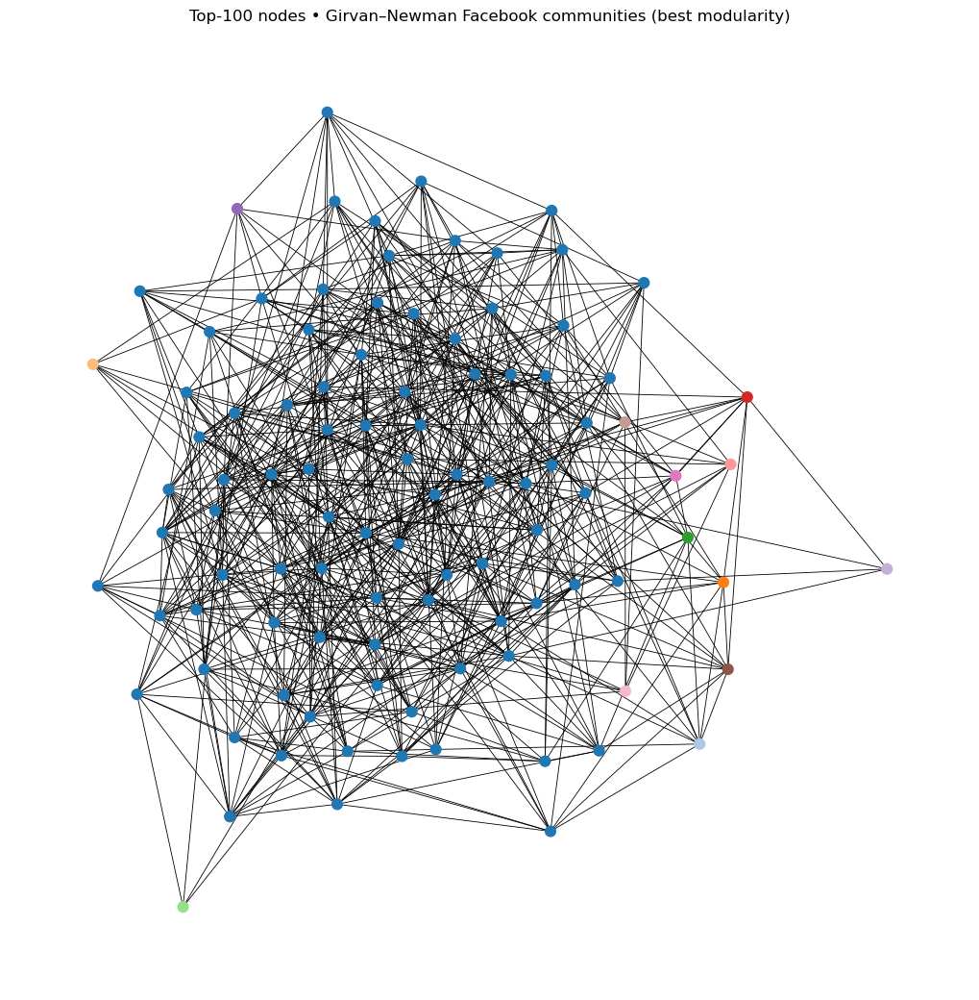

In [49]:

target = Facebook_H  

if target.number_of_edges() == 0:
    print("Selected graph has no edges — each node is its own community.")
    communities_GN_Facebook = [set([u]) for u in target.nodes()]
    best_mod = 0.0
else:
    best_mod, communities_GN_Facebook = girvan_newman_best_partition(target)
    print(f"Girvan–Newman on subgraph: {len(communities_GN_Facebook)} communities, modularity={best_mod:.4f}")

palette = plt.cm.tab20.colors
cid = {u: i for i, comm in enumerate(communities_GN_Facebook) for u in comm}
node_colors = [palette[cid[u] % len(palette)] for u in target.nodes()]

plt.figure(figsize=(10,10))
pos = nx.spring_layout(target, seed=7) 
nx.draw(target, pos, node_color=node_colors, node_size=60, width=0.6, with_labels=False)
plt.title("Top-100 nodes • Girvan–Newman Facebook communities (best modularity)")
plt.show()

In [50]:
k = len(communities_GN_Facebook)
print("Number of communities:", k)

Number of communities: 14


In [51]:
rows = []

for i, C in enumerate(communities_GN_Facebook):
    sub = target.subgraph(C)
    l_c = sub.number_of_edges()
    size = len(C)

    degs = dict(sub.degree())
    vol = sum(dict(target.degree(C)).values())
    cut = sum(1 for u in C for v in target.neighbors(u) if v not in C)

    rows.append({
        "community": i,
        "size": size,
        "internal_edges": l_c,
        "density": nx.density(sub),
        "avg_degree": sum(degs.values()) / size,
        "clustering": nx.average_clustering(sub),
        "cut_edges": cut,
        "conductance": cut / max(1, min(vol, 2*target.number_of_edges() - vol)),
    })

import pandas as pd
df_metrics = pd.DataFrame(rows)
df_metrics


,community,size,internal_edges,density,avg_degree,clustering,cut_edges,conductance
0,0,87,581,0.155306,13.356322,0.155864,84,0.763636
1,1,1,0,0.000000,0.000000,0.000000,10,1.000000
2,2,1,0,0.000000,0.000000,0.000000,10,1.000000
3,3,1,0,0.000000,0.000000,0.000000,7,1.000000
4,4,1,0,0.000000,0.000000,0.000000,10,1.000000
5,5,1,0,0.000000,0.000000,0.000000,4,1.000000
6,6,1,0,0.000000,0.000000,0.000000,11,1.000000
7,7,1,0,0.000000,0.000000,0.000000,8,1.000000
8,8,1,0,0.000000,0.000000,0.000000,8,1.000000
9,9,1,0,0.000000,0.000000,0.000000,4,1.000000


Girvan–Newman on subgraph: 14 communities, modularity=0.0019


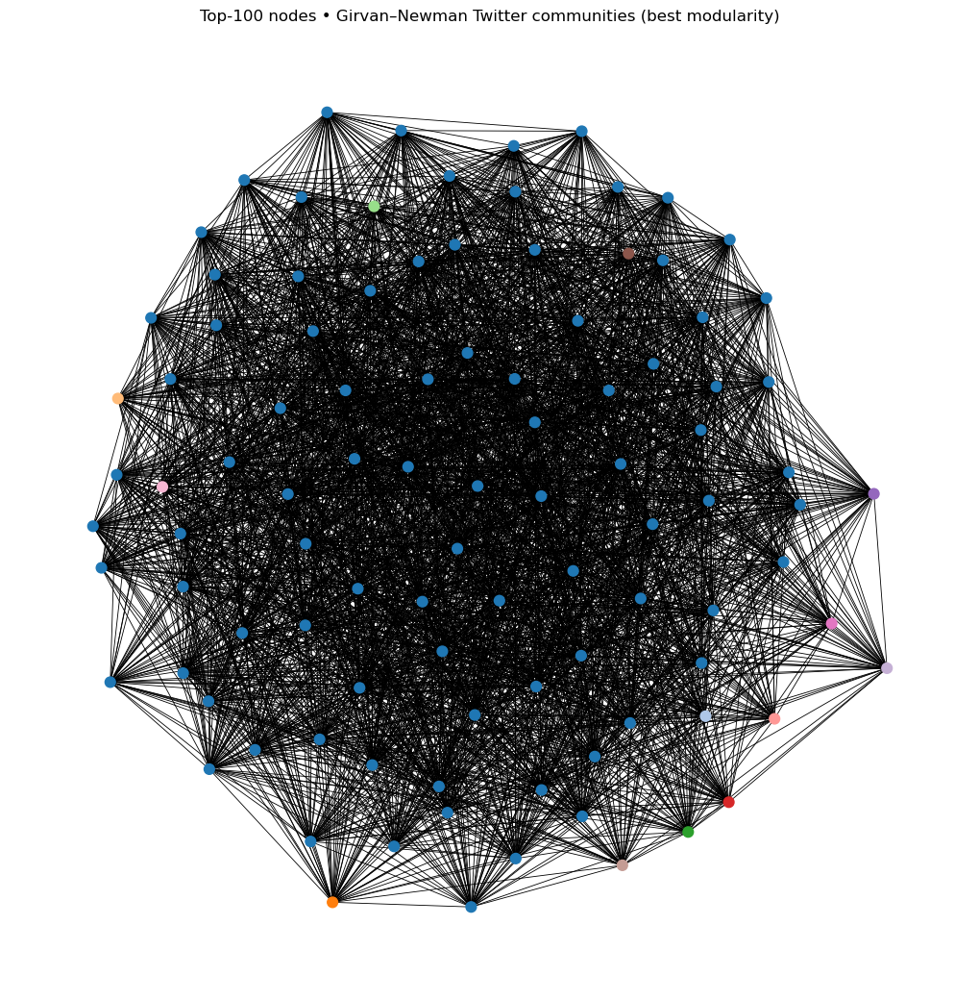

In [52]:

target = Twitter_H  

if target.number_of_edges() == 0:
    print("Selected graph has no edges — each node is its own community.")
    communities_GN_Twitter = [set([u]) for u in target.nodes()]
    best_mod = 0.0
else:
    best_mod, communities_GN_Twitter = girvan_newman_best_partition(target)
    print(f"Girvan–Newman on subgraph: {len(communities_GN_Twitter)} communities, modularity={best_mod:.4f}")

palette = plt.cm.tab20.colors
cid = {u: i for i, comm in enumerate(communities_GN_Twitter) for u in comm}
node_colors = [palette[cid[u] % len(palette)] for u in target.nodes()]

plt.figure(figsize=(10,10))
pos = nx.spring_layout(target, seed=7)
nx.draw(target, pos, node_color=node_colors, node_size=60, width=0.6, with_labels=False)
plt.title("Top-100 nodes • Girvan–Newman Twitter communities (best modularity)")
plt.show()

In [53]:
k = len(communities_GN_Twitter)
print("Number of communities:", k)

Number of communities: 14


In [54]:
rows = []

for i, C in enumerate(communities_GN_Twitter):
    sub = target.subgraph(C)
    l_c = sub.number_of_edges()
    size = len(C)

    degs = dict(sub.degree())
    vol = sum(dict(target.degree(C)).values())
    cut = sum(1 for u in C for v in target.neighbors(u) if v not in C)

    rows.append({
        "community": i,
        "size": size,
        "internal_edges": l_c,
        "density": nx.density(sub),
        "avg_degree": sum(degs.values()) / size,
        "clustering": nx.average_clustering(sub),
        "cut_edges": cut,
        "conductance": cut / max(1, min(vol, 2*target.number_of_edges() - vol)),
    })

import pandas as pd
df_metrics = pd.DataFrame(rows)
df_metrics


,community,size,internal_edges,density,avg_degree,clustering,cut_edges,conductance
0,0,87,2183,0.583534,50.183908,0.581474,530,0.863192
1,1,1,0,0.000000,0.000000,0.000000,47,1.000000
2,2,1,0,0.000000,0.000000,0.000000,49,1.000000
3,3,1,0,0.000000,0.000000,0.000000,44,1.000000
4,4,1,0,0.000000,0.000000,0.000000,50,1.000000
5,5,1,0,0.000000,0.000000,0.000000,49,1.000000
6,6,1,0,0.000000,0.000000,0.000000,46,1.000000
7,7,1,0,0.000000,0.000000,0.000000,45,1.000000
8,8,1,0,0.000000,0.000000,0.000000,51,1.000000
9,9,1,0,0.000000,0.000000,0.000000,42,1.000000


Girvan–Newman on subgraph: 9 communities, modularity=0.6169


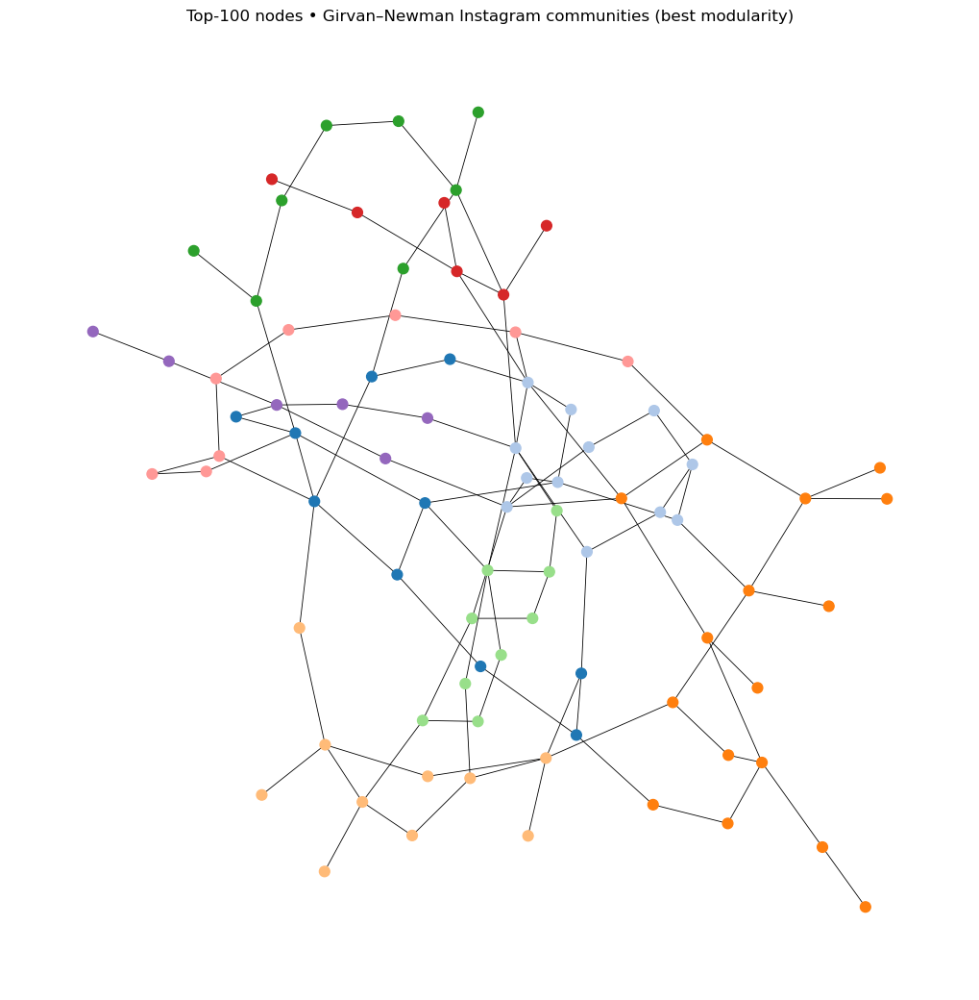

In [55]:

target = Instagram_H

if target.number_of_edges() == 0:
    print("Selected graph has no edges — each node is its own community.")
    communities_GN_Instagram = [set([u]) for u in target.nodes()]
    best_mod = 0.0
else:
    best_mod, communities_GN_Instagram = girvan_newman_best_partition(target)
    print(f"Girvan–Newman on subgraph: {len(communities_GN_Instagram)} communities, modularity={best_mod:.4f}")

palette = plt.cm.tab20.colors
cid = {u: i for i, comm in enumerate(communities_GN_Instagram) for u in comm}
node_colors = [palette[cid[u] % len(palette)] for u in target.nodes()]

plt.figure(figsize=(10,10))
pos = nx.spring_layout(target, seed=7)
nx.draw(target, pos, node_color=node_colors, node_size=60, width=0.6, with_labels=False)
plt.title("Top-100 nodes • Girvan–Newman Instagram communities (best modularity)")
plt.show()

In [56]:
k = len(communities_GN_Instagram)
print("Number of communities:", k)

Number of communities: 9


In [57]:
rows = []

for i, C in enumerate(communities_GN_Instagram):
    sub = target.subgraph(C)
    l_c = sub.number_of_edges()
    size = len(C)

    degs = dict(sub.degree())
    vol = sum(dict(target.degree(C)).values())
    cut = sum(1 for u in C for v in target.neighbors(u) if v not in C)

    rows.append({
        "community": i,
        "size": size,
        "internal_edges": l_c,
        "density": nx.density(sub),
        "avg_degree": sum(degs.values()) / size,
        "clustering": nx.average_clustering(sub),
        "cut_edges": cut,
        "conductance": cut / max(1, min(vol, 2*target.number_of_edges() - vol)),
    })

import pandas as pd
df_metrics = pd.DataFrame(rows)
df_metrics


,community,size,internal_edges,density,avg_degree,clustering,cut_edges,conductance
0,0,10,10,0.222222,2.000000,0.0,12,0.375000
1,1,12,13,0.196970,2.166667,0.0,14,0.350000
2,2,16,16,0.133333,2.000000,0.0,6,0.157895
3,3,10,10,0.222222,2.000000,0.0,5,0.200000
4,4,8,7,0.250000,1.750000,0.0,3,0.176471
5,5,9,9,0.250000,2.000000,0.0,6,0.250000
6,6,6,5,0.333333,1.666667,0.0,3,0.230769
7,7,8,7,0.250000,1.750000,0.0,4,0.222222
8,8,6,5,0.333333,1.666667,0.0,3,0.230769


## Kernighan Lin

In [58]:

# One KL bisection on a graph
def kl_bisect_once(G, max_iter=50, seed=42):
    """
    Run a single Kernighan–Lin bisection on G.
    Returns (A, B) as sets. Requires at least 2 nodes.
    """
    if G.number_of_nodes() < 2:
        return set(G.nodes()), set()
    A, B = nx.algorithms.community.kernighan_lin_bisection(G, max_iter=max_iter, seed=seed)
    return set(A), set(B)

# Recursive KL
def kl_recursive_partition(G, max_comms=10, min_size=5, min_mod_gain=1e-3, max_iter=50, seed=42):
    """
    Recursively apply KL bisections to maximize modularity on the ORIGINAL graph G.
    Stops when no split yields modularity gain above `min_mod_gain`, community count reaches `max_comms`
    or candidate communities are smaller than `min_size`.
    """
    partition = [set(G.nodes())]
    base_mod = nx_comm.modularity(G, partition) if G.number_of_edges() > 0 else 0.0

    improved = True
    while improved and len(partition) < max_comms:
        improved = False
        best_gain, best_idx, best_split = 0.0, None, None

        for idx, comm in enumerate(partition):
            if len(comm) < 2 * min_size:   # need enough nodes to split into two >= min_size
                continue

            sub = G.subgraph(comm).copy()
            try:
                A, B = kl_bisect_once(sub, max_iter=max_iter, seed=seed)
            except Exception:
                continue
            if len(A) < min_size or len(B) < min_size:
                continue

            candidate = partition[:idx] + [A, B] + partition[idx+1:]
            mod = nx_comm.modularity(G, candidate) if G.number_of_edges() > 0 else 0.0
            gain = mod - base_mod

            if gain > best_gain:
                best_gain, best_idx, best_split = gain, idx, (A, B)

        if best_gain > min_mod_gain and best_split is not None:
            # accept the best split
            A, B = best_split
            partition = partition[:best_idx] + [A, B] + partition[best_idx+1:]
            base_mod += best_gain
            improved = True

    return base_mod, partition

# 3) Run and plot it
def color_partition_and_plot(G, partition, pos=None, title_prefix="KL communities"):
    # color mapping
    palette = plt.cm.tab20.colors
    cid = {u: i for i, comm in enumerate(partition) for u in comm}
    colors = [palette[cid[u] % len(palette)] for u in G.nodes()]

    if pos is None:
        pos = nx.spring_layout(G, seed=7)

    plt.figure(figsize=(10,10))
    nx.draw(G, pos, node_color=colors, node_size=60, width=0.6, with_labels=False)
    plt.title(f"{title_prefix} • k={len(partition)}")
    plt.show()
    return pos


KL recursive: 4 communities, modularity=0.2144


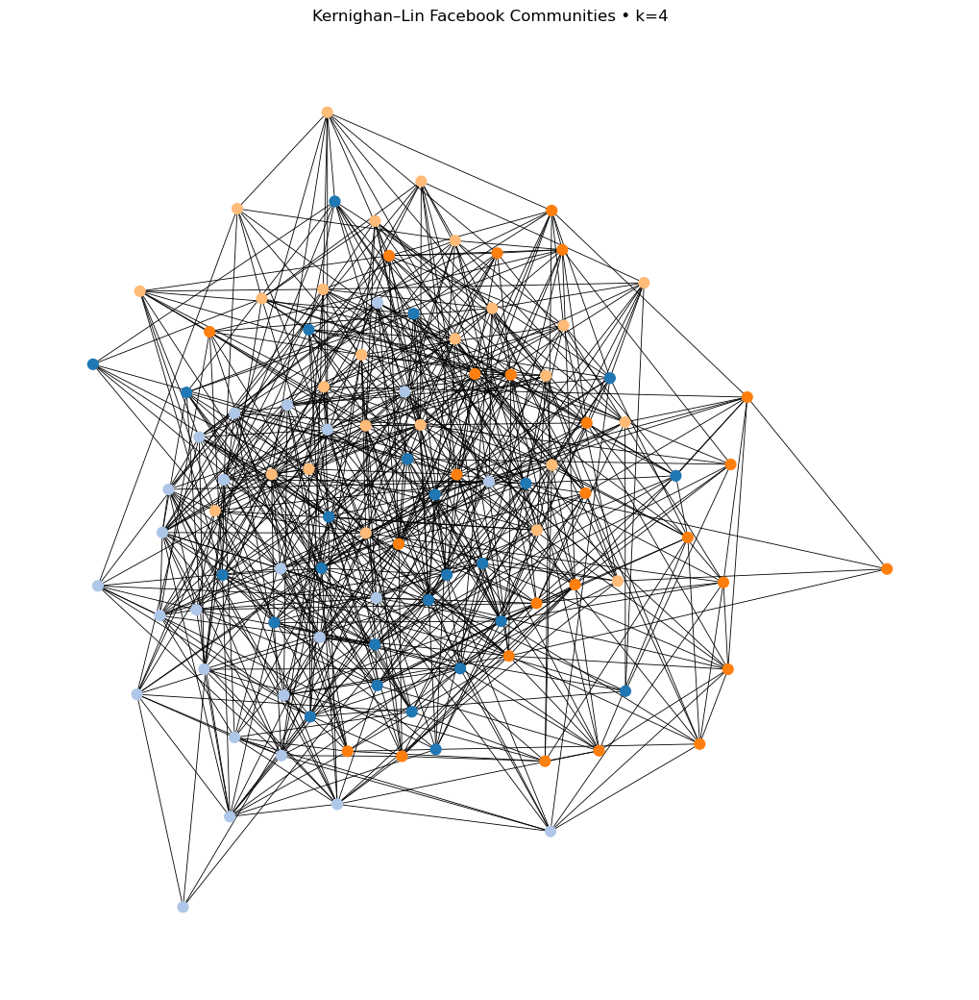

In [59]:

target = Facebook_H 

if target.number_of_edges() == 0:
    print("Graph has no edges; each node is its own community.")
    communities_KL_Facebook = [set([u]) for u in target.nodes()]
    best_mod = 0.0
else:
    best_mod, communities_KL_Facebook = kl_recursive_partition(
        target,
        max_comms=8,        
        min_size=4,         
        min_mod_gain=1e-3,
        max_iter=50,
        seed=42
    )
    print(f"KL recursive: {len(communities_KL_Facebook)} communities, modularity={best_mod:.4f}")

pos = None 
pos = color_partition_and_plot(target, communities_KL_Facebook, pos=pos, title_prefix="Kernighan–Lin Facebook Communities")

In [60]:
k = len(communities_KL_Facebook)
print("Number of communities:", k)

Number of communities: 4


In [61]:
rows = []

for i, C in enumerate(communities_KL_Facebook):
    sub = target.subgraph(C)
    l_c = sub.number_of_edges()
    size = len(C)

    degs = dict(sub.degree())
    vol = sum(dict(target.degree(C)).values())
    cut = sum(1 for u in C for v in target.neighbors(u) if v not in C)

    rows.append({
        "community": i,
        "size": size,
        "internal_edges": l_c,
        "density": nx.density(sub),
        "avg_degree": sum(degs.values()) / size,
        "clustering": nx.average_clustering(sub),
        "cut_edges": cut,
        "conductance": cut / max(1, min(vol, 2*target.number_of_edges() - vol)),
    })

import pandas as pd
df_metrics = pd.DataFrame(rows)
df_metrics


,community,size,internal_edges,density,avg_degree,clustering,cut_edges,conductance
0,0,25,80,0.266667,6.40,0.238635,190,0.542857
1,1,25,79,0.263333,6.32,0.238581,182,0.535294
2,2,25,75,0.250000,6.00,0.266020,173,0.535604
3,3,25,81,0.270000,6.48,0.229365,181,0.527697


KL recursive: 4 communities, modularity=0.0687


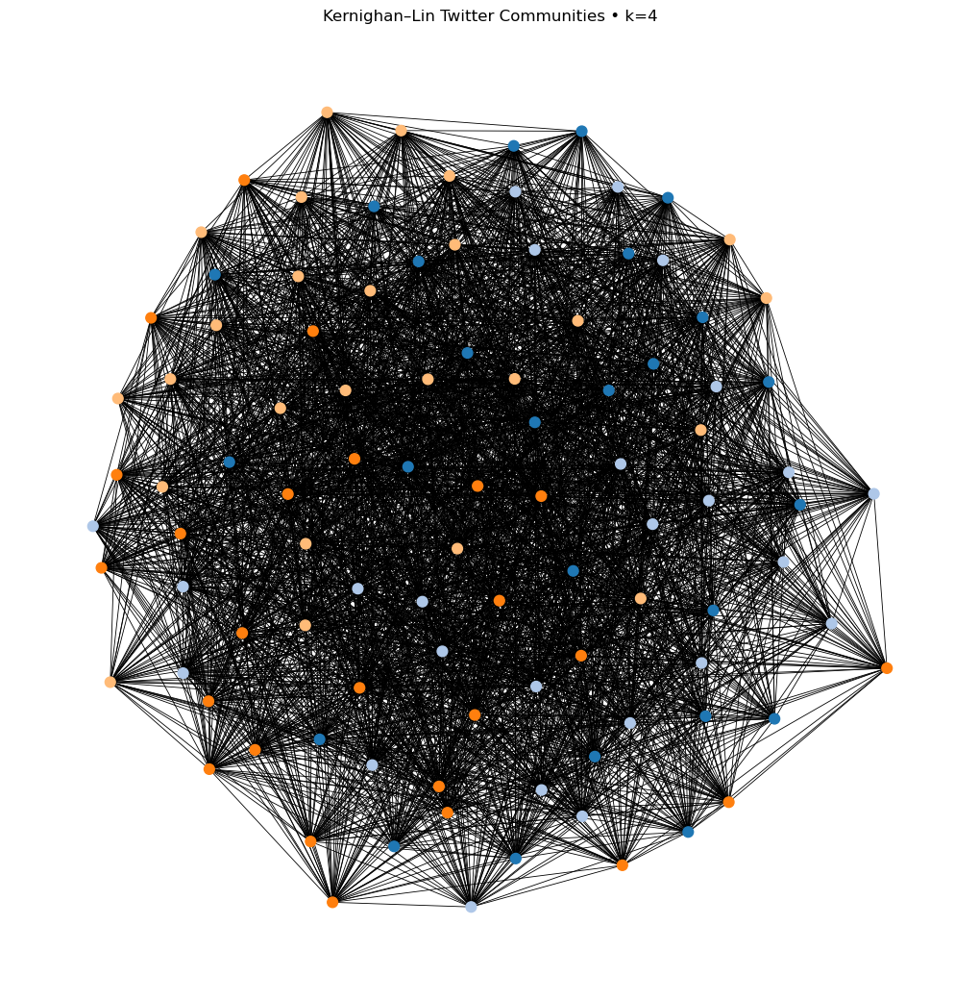

In [62]:

target = Twitter_H 

if target.number_of_edges() == 0:
    print("Graph has no edges; each node is its own community.")
    communities_KL_Twitter = [set([u]) for u in target.nodes()]
    best_mod = 0.0
else:
    best_mod, communities_KL_Twitter = kl_recursive_partition(
        target,
        max_comms=8,        
        min_size=4,         
        min_mod_gain=1e-3,  
        max_iter=50,
        seed=42
    )
    print(f"KL recursive: {len(communities_KL_Twitter)} communities, modularity={best_mod:.4f}")

pos = None  
pos = color_partition_and_plot(target, communities_KL_Twitter, pos=pos, title_prefix="Kernighan–Lin Twitter Communities")

In [63]:
k = len(communities_KL_Twitter)
print("Number of communities:", k)

Number of communities: 4


In [64]:
rows = []

for i, C in enumerate(communities_KL_Twitter):
    sub = target.subgraph(C)
    l_c = sub.number_of_edges()
    size = len(C)

    degs = dict(sub.degree())
    vol = sum(dict(target.degree(C)).values())
    cut = sum(1 for u in C for v in target.neighbors(u) if v not in C)

    rows.append({
        "community": i,
        "size": size,
        "internal_edges": l_c,
        "density": nx.density(sub),
        "avg_degree": sum(degs.values()) / size,
        "clustering": nx.average_clustering(sub),
        "cut_edges": cut,
        "conductance": cut / max(1, min(vol, 2*target.number_of_edges() - vol)),
    })

import pandas as pd
df_metrics = pd.DataFrame(rows)
df_metrics


,community,size,internal_edges,density,avg_degree,clustering,cut_edges,conductance
0,0,25,218,0.726667,17.44,0.722879,925,0.679647
1,1,25,221,0.736667,17.68,0.723096,957,0.684060
2,2,25,219,0.730000,17.52,0.721907,929,0.679590
3,3,25,220,0.733333,17.60,0.720282,943,0.681851


KL recursive: 7 communities, modularity=0.5893


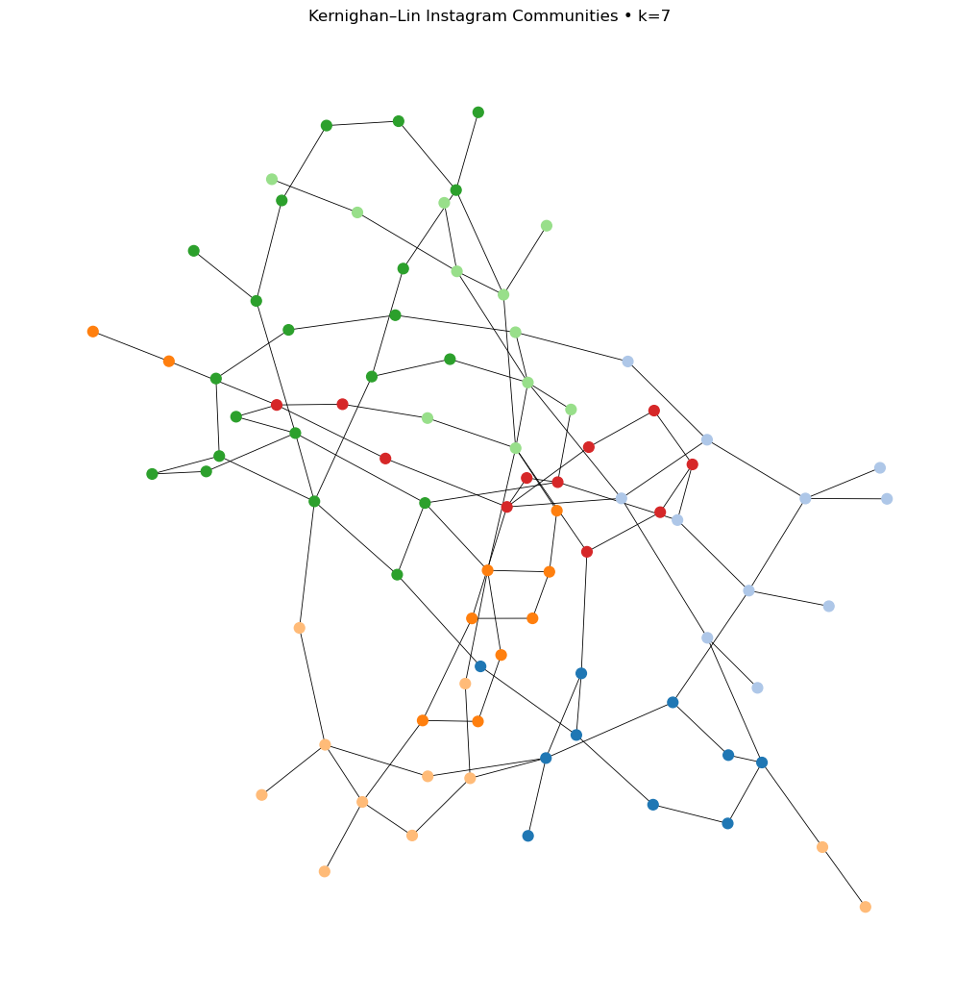

In [65]:

target = Instagram_H  

if target.number_of_edges() == 0:
    print("Graph has no edges; each node is its own community.")
    communities_KL_Instagram = [set([u]) for u in target.nodes()]
    best_mod = 0.0
else:
    best_mod, communities_KL_Instagram = kl_recursive_partition(
        target,
        max_comms=8,        
        min_size=4,         
        min_mod_gain=1e-3, 
        max_iter=50,
        seed=42
    )
    print(f"KL recursive: {len(communities_KL_Instagram)} communities, modularity={best_mod:.4f}")

pos = None 
pos = color_partition_and_plot(target, communities_KL_Instagram, pos=pos, title_prefix="Kernighan–Lin Instagram Communities")

In [66]:
k = len(communities_KL_Instagram)
print("Number of communities:", k)

Number of communities: 7


In [67]:
rows = []

for i, C in enumerate(communities_KL_Instagram):
    sub = target.subgraph(C)
    l_c = sub.number_of_edges()
    size = len(C)

    degs = dict(sub.degree())
    vol = sum(dict(target.degree(C)).values())
    cut = sum(1 for u in C for v in target.neighbors(u) if v not in C)

    rows.append({
        "community": i,
        "size": size,
        "internal_edges": l_c,
        "density": nx.density(sub),
        "avg_degree": sum(degs.values()) / size,
        "clustering": nx.average_clustering(sub),
        "cut_edges": cut,
        "conductance": cut / max(1, min(vol, 2*target.number_of_edges() - vol)),
    })

import pandas as pd
df_metrics = pd.DataFrame(rows)
df_metrics


,community,size,internal_edges,density,avg_degree,clustering,cut_edges,conductance
0,0,10,10,0.222222,2.000000,0.0,7,0.259259
1,1,11,10,0.181818,1.818182,0.0,7,0.259259
2,2,10,9,0.200000,1.800000,0.0,7,0.280000
3,3,11,9,0.163636,1.636364,0.0,6,0.250000
4,4,21,23,0.109524,2.190476,0.0,8,0.148148
5,5,11,11,0.200000,2.000000,0.0,10,0.312500
6,6,11,10,0.181818,1.818182,0.0,11,0.354839


In [68]:

def fit_vector_size(self, **skip_gram_params):
    # gensim>=4 uses vector_size instead of size
    if "vector_size" not in skip_gram_params:
        skip_gram_params["vector_size"] = self.dimensions
    # remove old param if present
    skip_gram_params.pop("size", None)
    return gensim.models.Word2Vec(self.walks, **skip_gram_params)

# patch it
n2vmod.Node2Vec.fit = fit_vector_size
print("Patched node2vec.fit() to use vector_size")


Patched node2vec.fit() to use vector_size
